In [1]:
# the usuals
import geopandas as gpd
import matplotlib.pyplot as plt
import pandas as pd
import contextily as ctx
from sodapy import Socrata

# new for data viz
import seaborn as sns

# to explore point patterns
from pointpats import centrography
from matplotlib.patches import Ellipse
import numpy

/opt/conda/lib/python3.8/site-packages/geopandas/_compat.py:106: UserWarning: The Shapely GEOS version (3.8.1-CAPI-1.13.3) is incompatible with the GEOS version PyGEOS was compiled with (3.9.0-CAPI-1.16.2). Conversions between both will be slow.
  warnings.warn(


In [2]:
hc = gpd.read_file('flac.geojson')

In [3]:
hc.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 4641 entries, 0 to 4640
Data columns (total 59 columns):
 #   Column                          Non-Null Count  Dtype   
---  ------                          --------------  -----   
 0   LICENSED_CERTIFIED              4641 non-null   object  
 1   FLAG                            4641 non-null   object  
 2   T18_19                          4641 non-null   object  
 3   FACID                           4641 non-null   int64   
 4   FAC_STATUS_TYPE_CODE            4641 non-null   object  
 5   ASPEN_FACID                     4641 non-null   object  
 6   CCN                             4641 non-null   object  
 7   TERMINAT_SW                     4641 non-null   object  
 8   PARTICIPATION_DATE              4641 non-null   object  
 9   APPROVAL_DATE                   4641 non-null   object  
 10  NPI                             2826 non-null   float64 
 11  CAN_BE_DEEMED_FAC_TYPE          4641 non-null   object  
 12  CAN_BE_CERTI

In [4]:
type(hc)

geopandas.geodataframe.GeoDataFrame

In [5]:
hc=hc[['LICENSED_CERTIFIED','CITY','FAC_FDR','ADDRESS','geometry']]

In [6]:
hc.columns = ['Licensed_certified_both','City','Type_of_Care','Address','geometry']

In [7]:
hc.shape

(4641, 5)

In [8]:
hc.sample(20)

,Licensed_certified_both,City,Type_of_Care,Address,geometry
1223,CERTIFIED ONLY,LOS ANGELES,SURGICAL CLINIC,500 S VIRGIL AVE,POINT (-118.28669 34.06495)
4237,LICENSED AND CERTIFIED,PASADENA,SKILLED NURSING FACILITY,150 BELLEFONTAINE ST,POINT (-118.15359 34.13119)
3880,LICENSED AND CERTIFIED,CHATSWORTH,INTERMEDIATE CARE FACILITY-DD/H/N/CN/IID,11051 OLD SANTA SUSANA PASS RD,POINT (-118.60700 34.27078)
2355,LICENSED ONLY,VAN NUYS,HOSPICE,6742 VAN NUYS BLVD,POINT (-118.44845 34.19342)
1978,LICENSED ONLY,GLENDALE,HOME HEALTH AGENCY,1110 SONORA AVENUE,POINT (-118.28495 34.16862)
775,LICENSED AND CERTIFIED,WEST COVINA,HOSPICE,2550 E AMAR RD,POINT (-117.89624 34.02682)
4587,LICENSED AND CERTIFIED,PANORAMA CITY,HOME HEALTH AGENCY,14621 TITUS ST,POINT (-118.45164 34.21986)
1213,LICENSED AND CERTIFIED,VAN NUYS,HOSPICE,14349 VICTORY BLVD,POINT (-118.44602 34.18698)
2381,LICENSED ONLY,GLENDALE,HOME HEALTH AGENCY,127 S BRAND BLVD,POINT (-118.25546 34.14529)
180,LICENSED ONLY,LYNWOOD,PRIMARY CARE CLINIC,11682 ATLANTIC AVE,POINT (-118.18872 33.91723)


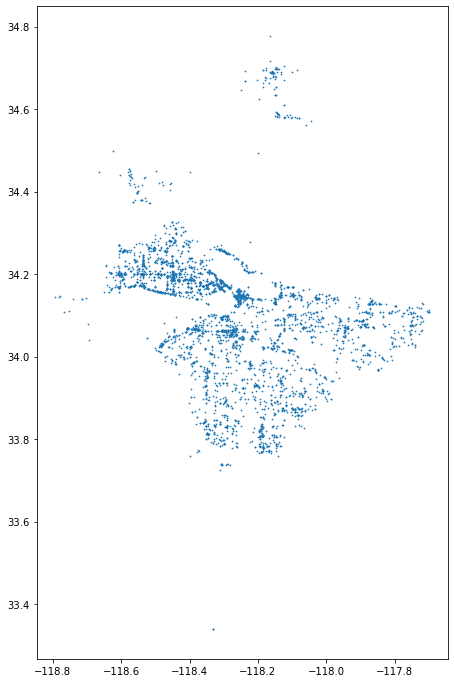

In [9]:
hc.plot(figsize=(12,12),
             markersize=0.5)

In [10]:
import ipywidgets as widgets
from ipywidgets import interact, interact_manual

In [11]:
hc.Type_of_Care.value_counts()

HOME HEALTH AGENCY                              1445
HOSPICE                                         1012
PRIMARY CARE CLINIC                              554
SKILLED NURSING FACILITY                         385
SURGICAL CLINIC                                  270
INTERMEDIATE CARE FACILITY-DD/H/N/CN/IID         248
CHRONIC DIALYSIS CLINIC                          206
ADULT DAY HEALTH CARE                            172
CONGREGATE LIVING HEALTH FACILITY                150
GENERAL ACUTE CARE HOSPITAL                       94
ACUTE PSYCHIATRIC HOSPITAL                        43
REHABILITATION CLINIC                             34
PSYCHOLOGY CLINIC                                  9
OTHER                                              7
CHEMICAL DEPENDENCY RECOVERY HOSPITAL              4
REFERRAL AGENCY                                    2
CORRECTIONAL TREATMENT CENTER                      2
PEDIATRIC DAY HEALTH & RESPITE CARE FACILITY       2
ALTERNATIVE BIRTHING CENTER                   

In [12]:
a = hc[hc.Type_of_Care == 'HOME HEALTH AGENCY'].head()
b = hc[hc.Type_of_Care == 'HOSPICE'].head()
c = hc[hc.Type_of_Care == 'PRIMARY CARE CLINIC'].head()
d = hc[hc.Type_of_Care == 'REHABILITATION CLINIC'].head()
e = hc[hc.Type_of_Care == 'SURGICAL CLINIC'].head()
f = hc[hc.Type_of_Care == 'CHRONIC DIALYSIS CLINIC'].head()
g = hc[hc.Type_of_Care == 'SKILLED NURSE FACILITY'].head()

In [13]:
# create a function
def health(Type_of_Care = 'HOME HEALTH AGENCY'): 
    # table
    display(hc[hc.Type_of_Care == Type_of_Care].head()) 
    
    # map
    ax = hc[hc.Type_of_Care == Type_of_Care].plot(figsize=(9,9), markersize=2)
    
    # axis
    ax.axis('off')
    
    # basemap
    ctx.add_basemap(ax,
                    crs='epsg:4326', # surprise! You can change the crs here!
                    source=ctx.providers.CartoDB.Positron)

,Licensed_certified_both,City,Type_of_Care,Address,geometry
166,LICENSED AND CERTIFIED,ENCINO,HOSPICE,15821 VENTURA BLVD,POINT (-118.47816 34.15604)
196,LICENSED AND CERTIFIED,STEVENSON RANCH,HOSPICE,25129 THE OLD RD,POINT (-118.56446 34.37493)
203,LICENSED AND CERTIFIED,PASADENA,HOSPICE,133 N ALTADENA DR,POINT (-118.09922 34.14853)
256,LICENSED AND CERTIFIED,ENCINO,HOSPICE,15821 VENTURA BLVD,POINT (-118.47816 34.15604)
257,LICENSED AND CERTIFIED,BURBANK,HOSPICE,704 S VICTORY BLVD,POINT (-118.31065 34.16902)


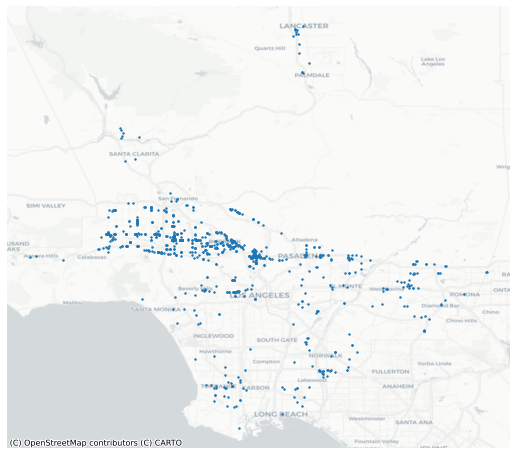

In [14]:
health(Type_of_Care = 'HOSPICE')

,Licensed_certified_both,City,Type_of_Care,Address,geometry
0,LICENSED AND CERTIFIED,ALHAMBRA,HOME HEALTH AGENCY,821 S GARFIELD AVE,POINT (-118.12331 34.08651)
13,LICENSED AND CERTIFIED,LOS ANGELES,HOME HEALTH AGENCY,10700 SANTA MONICA BLVD,POINT (-118.43193 34.05181)
103,LICENSED ONLY,SANTA FE SPRINGS,HOME HEALTH AGENCY,11980 TELEGRAPH RD,POINT (-118.07795 33.94341)
162,LICENSED ONLY,CERRITOS,HOME HEALTH AGENCY,17777 CENTER COURT DR,POINT (-118.06113 33.86917)
163,LICENSED AND CERTIFIED,CERRITOS,HOME HEALTH AGENCY,12611 HIDDENCREEK WAY,POINT (-118.06294 33.88565)


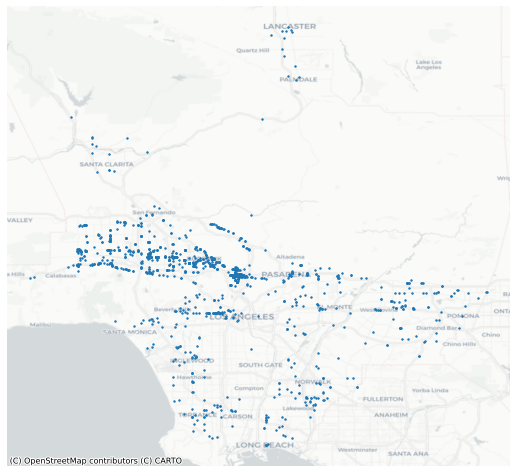

In [15]:
health(Type_of_Care = 'HOME HEALTH AGENCY')

In [16]:
# to make this function interactive
@interact

# function argument will become interactive
def health(Type_of_Care = 'HOME HEALTH AGENCY'): 
    # table
    display(hc[hc.Type_of_Care == Type_of_Care].head()) 
    
    # map
    ax = hc[hc.Type_of_Care == Type_of_Care].plot(figsize=(9,9), markersize=2)
    
    # axis
    ax.axis('off')
    
    # basemap
    ctx.add_basemap(ax,
                    crs='epsg:4326', # surprise! You can change the crs here!
                    source=ctx.providers.CartoDB.Positron)

interactive(children=(Text(value='HOME HEALTH AGENCY', description='Type_of_Care'), Output()), _dom_classes=('…

In [17]:
hc['x'] = hc.geometry.x
hc['y'] = hc.geometry.y

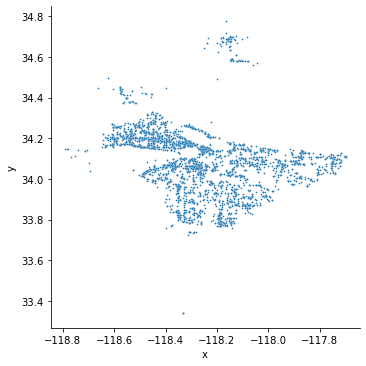

In [18]:
sns.relplot(data=hc,
            x='x', 
            y='y',
            s=3)

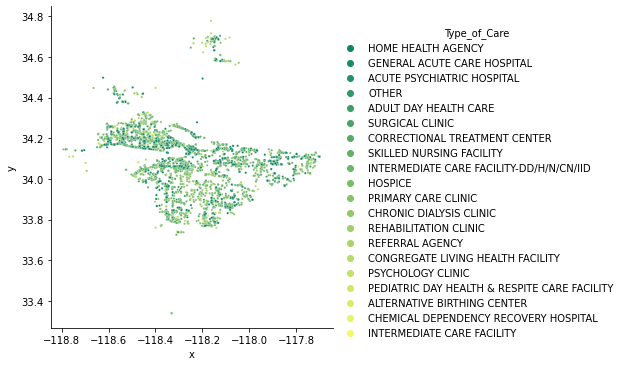

In [19]:
sns.relplot(data=hc,
            x='x', 
            y='y',
            hue='Type_of_Care',
            palette='summer',
            s=5)

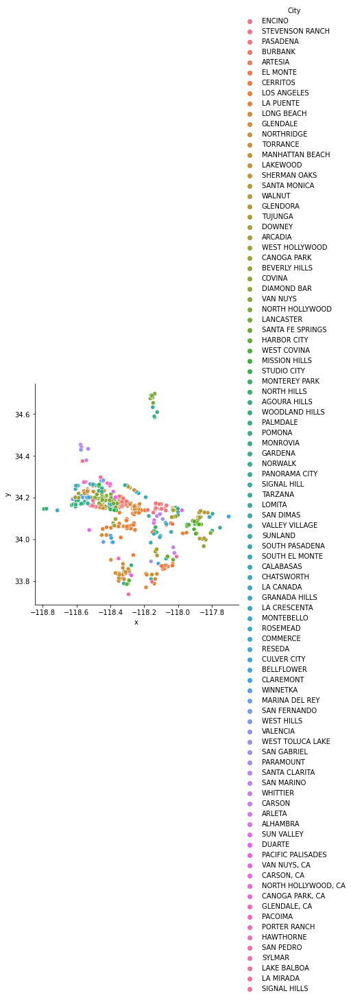

In [20]:
sns.relplot(data=hc[hc['Type_of_Care']=='HOSPICE'],
            x='x', 
            y='y',
            hue='City')

In [21]:
mean_center = centrography.mean_center(hc[['x','y']])
med_center = centrography.euclidean_median(hc[['x','y']])

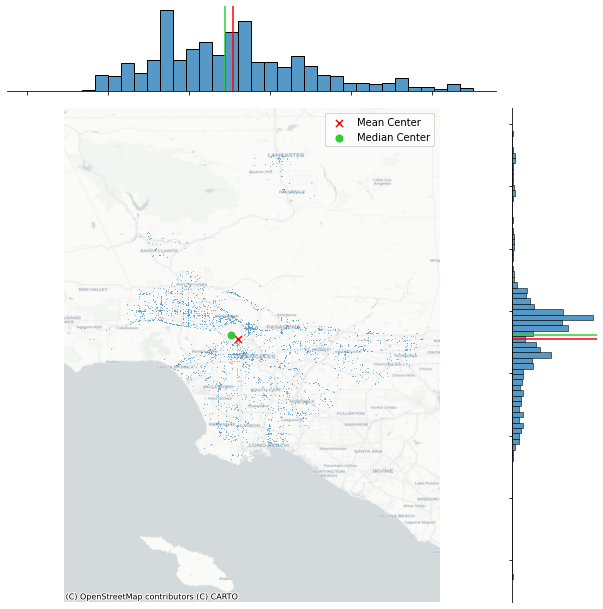

In [22]:
# Generate scatter plot
g = sns.jointplot(
    x='x', y='y', data=hc, s=0.75, height=9
)

# Add mean point and marginal lines
g.ax_joint.scatter(
    *mean_center, color='red', marker='x', s=50, label='Mean Center'
)
g.ax_marg_x.axvline(mean_center[0], color='red')
g.ax_marg_y.axhline(mean_center[1], color='red')

# Add median point and marginal lines
g.ax_joint.scatter(
    *med_center, color='limegreen', marker='o', s=50, label='Median Center'
)
g.ax_marg_x.axvline(med_center[0], color='limegreen')
g.ax_marg_y.axhline(med_center[1], color='limegreen')

# Legend
g.ax_joint.legend()

# Add basemap
ctx.add_basemap(
    g.ax_joint, 
    crs='epsg:4326',
    source=ctx.providers.CartoDB.Positron
)

# Clean axes
g.ax_joint.set_axis_off()

# Display
plt.show()

In [23]:
major, minor, rotation = centrography.ellipse(hc[['x','y']])

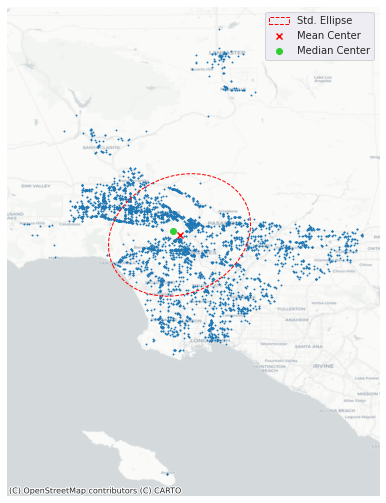

In [24]:
sns.set_style('dark')

# Set up figure and axis
f, ax = plt.subplots(1, figsize=(9, 9))

# Plot points
ax.scatter(hc['x'], hc['y'], s=0.75)
ax.scatter(*mean_center, color='red', marker='x', label='Mean Center')
ax.scatter(*med_center, color='limegreen', marker='o', label='Median Center')

# Construct the standard ellipse using matplotlib
ellipse = Ellipse(xy=mean_center, # center the ellipse on our mean center
                  width=major*2, # centrography.ellipse only gives half the axis
                  height=minor*2, 
                  angle = numpy.rad2deg(rotation), # Angles for this are in degrees, not radians
                  facecolor='none', 
                  edgecolor='red', 
                  linestyle='--',
                  label='Std. Ellipse')

ax.add_patch(ellipse)

ax.legend()

ax.axis('off')

# add a basemap
ctx.add_basemap(ax,
                crs='epsg:4326',
                source=ctx.providers.CartoDB.Positron)

# Display
plt.show()

In [25]:
hc.head()

,Licensed_certified_both,City,Type_of_Care,Address,geometry,x,y
0,LICENSED AND CERTIFIED,ALHAMBRA,HOME HEALTH AGENCY,821 S GARFIELD AVE,POINT (-118.12331 34.08651),-118.12331,34.086510
1,LICENSED AND CERTIFIED,TORRANCE,GENERAL ACUTE CARE HOSPITAL,1000 W CARSON ST,POINT (-118.29202 33.83033),-118.29202,33.830325
2,LICENSED AND CERTIFIED,DOWNEY,GENERAL ACUTE CARE HOSPITAL,7601 IMPERIAL HWY,POINT (-118.15800 33.92910),-118.15800,33.929100
3,LICENSED AND CERTIFIED,LOS ANGELES,GENERAL ACUTE CARE HOSPITAL,1680 EAST 120TH STREET,POINT (-118.24415 33.92419),-118.24415,33.924186
4,LICENSED AND CERTIFIED,SYLMAR,GENERAL ACUTE CARE HOSPITAL,14445 OLIVE VIEW DR,POINT (-118.45170 34.32698),-118.45170,34.326981


In [26]:
def acc(City, Type_of_Care):
    
    # filter the data by type of care
    hc_filtered = hc[(hc.Type_of_Care == Type_of_Care) & (hc.City == City)]

    # mean center and median
    mean_center = centrography.mean_center(hc_filtered[['x','y']])
    med_center = centrography.euclidean_median(hc_filtered[['x','y']])

    # standard ellipse
    major, minor, rotation = centrography.ellipse(hc_filtered[['x','y']])

    # Set up figure and axis
    f, ax = plt.subplots(1, figsize=(9, 9))

    # plot facilities points
    ax.scatter(hc_filtered['x'], hc_filtered['y'], s=3)

    # add the mean and median center points
    ax.scatter(*mean_center, color='red', marker='x', label='Mean Center')
    ax.scatter(*med_center, color='limegreen', marker='o', label='Median Center')

    # Construct the standard ellipse using matplotlib
    ellipse = Ellipse(xy=mean_center, # center the ellipse on our mean center
                      width=major*2, # centrography.ellipse db_filtered
                      height=minor*2, 
                      angle = numpy.rad2deg(rotation), # Angles for this are in degrees, not radians
                      facecolor='none', 
                      edgecolor='red', linestyle='--',
                      label='Std. Ellipse')

    ax.add_patch(ellipse)

    # add the legend
    ax.legend()

    # no axix
    ax.axis('Off')

    # add a dynamic title
    ax.set_title(City + ': ' + str(len(hc_filtered))+ ' ' + Type_of_Care + ' facilities')

    # add a basemap
    ctx.add_basemap(ax,
                    crs='epsg:4326',
                    source=ctx.providers.CartoDB.Positron)
    # Display
    plt.show()

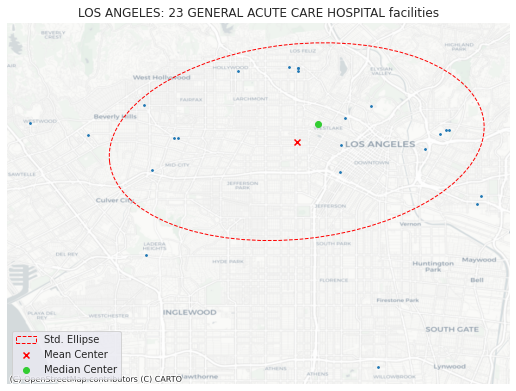

In [27]:
acc(City='LOS ANGELES',Type_of_Care='GENERAL ACUTE CARE HOSPITAL')

In [28]:
top10areas = hc['City'].value_counts().head(10).index.tolist()
top10areas

['LOS ANGELES',
 'VAN NUYS',
 'GLENDALE',
 'BURBANK',
 'NORTH HOLLYWOOD',
 'PASADENA',
 'LONG BEACH',
 'TORRANCE',
 'NORTHRIDGE',
 'ENCINO']

In [29]:
top10hc = hc['Type_of_Care'].value_counts().head(10).index.tolist()
top10hc

['HOME HEALTH AGENCY',
 'HOSPICE',
 'PRIMARY CARE CLINIC',
 'SKILLED NURSING FACILITY',
 'SURGICAL CLINIC',
 'INTERMEDIATE CARE FACILITY-DD/H/N/CN/IID',
 'CHRONIC DIALYSIS CLINIC',
 'ADULT DAY HEALTH CARE',
 'CONGREGATE LIVING HEALTH FACILITY',
 'GENERAL ACUTE CARE HOSPITAL']

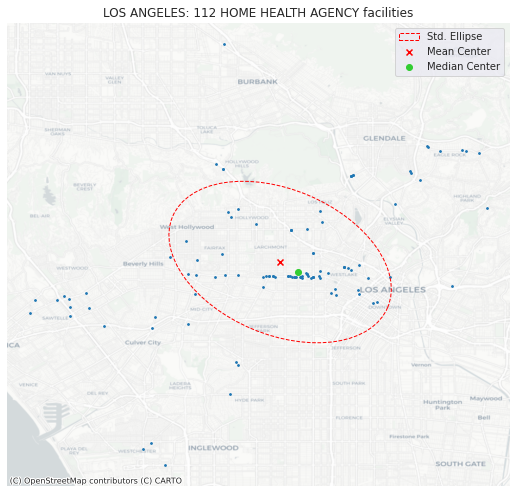

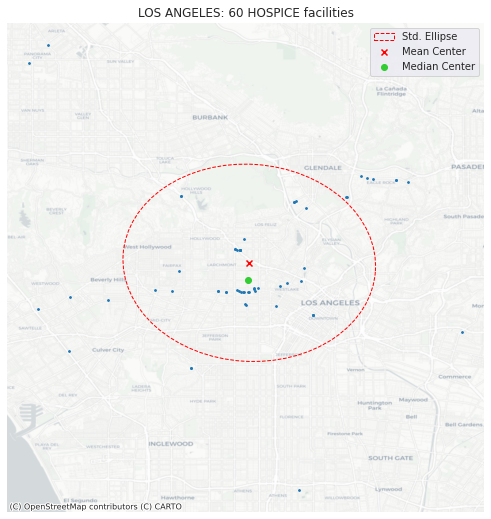

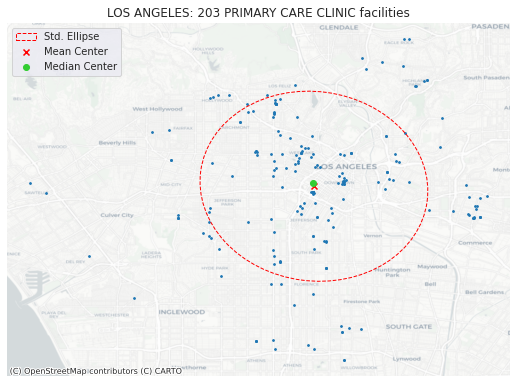

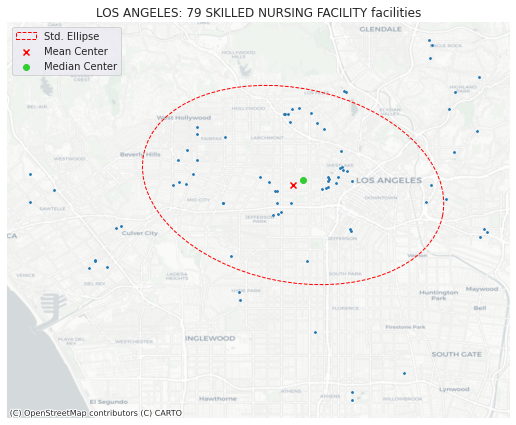

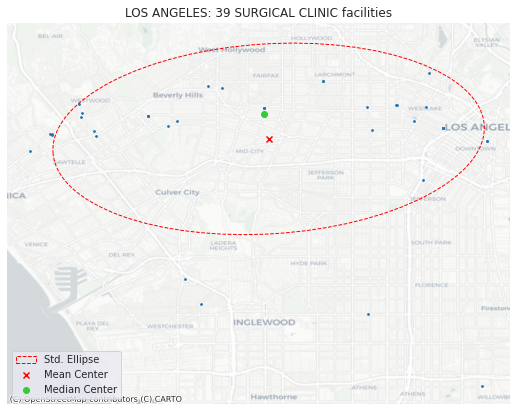

...

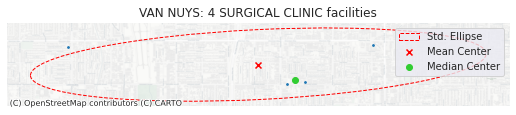

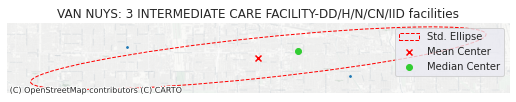

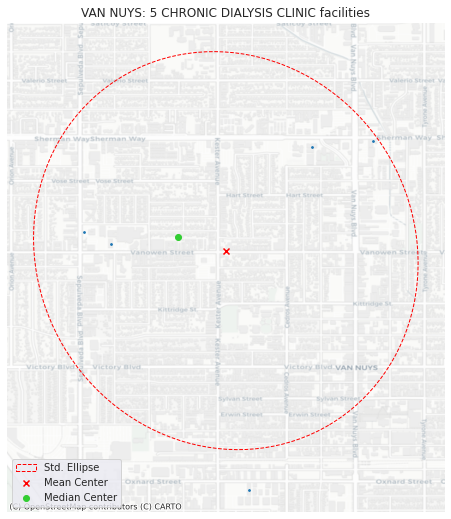

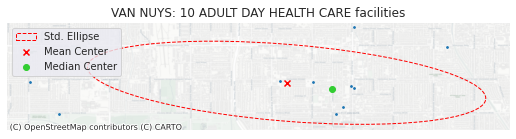

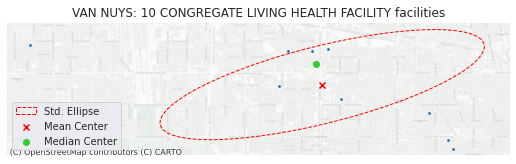

/opt/conda/lib/python3.8/site-packages/pointpats/centrography.py:269: RuntimeWarning: invalid value encountered in double_scalars
  theta = np.arctan(num / den)


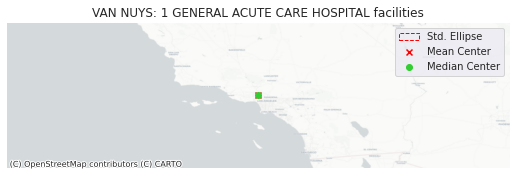

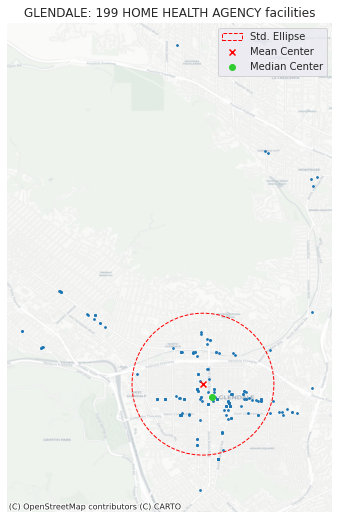

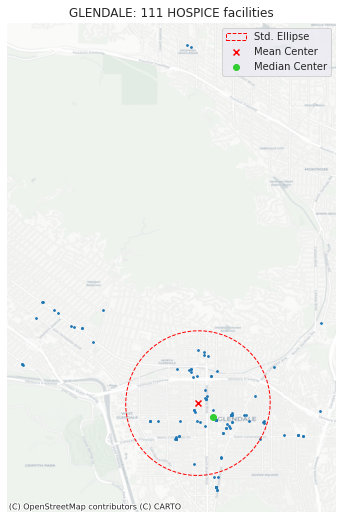

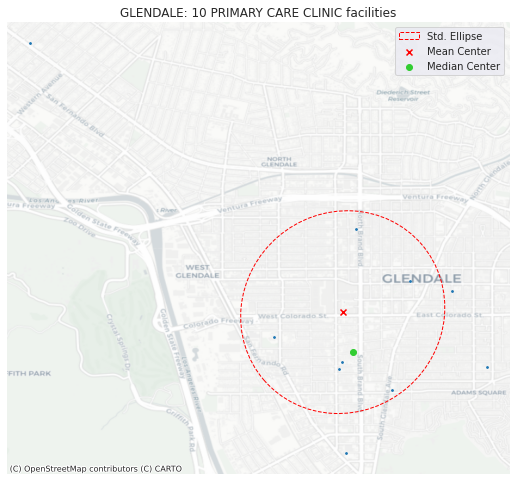

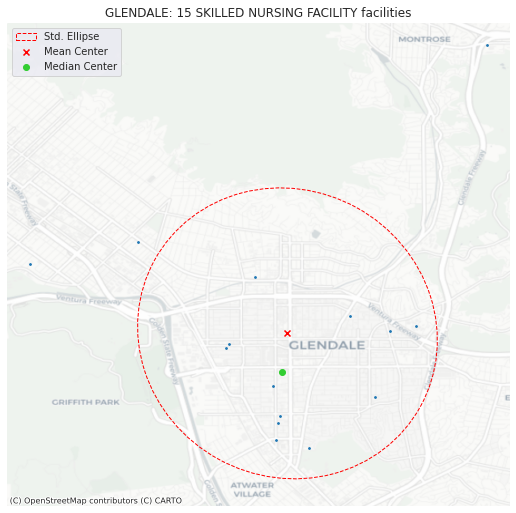

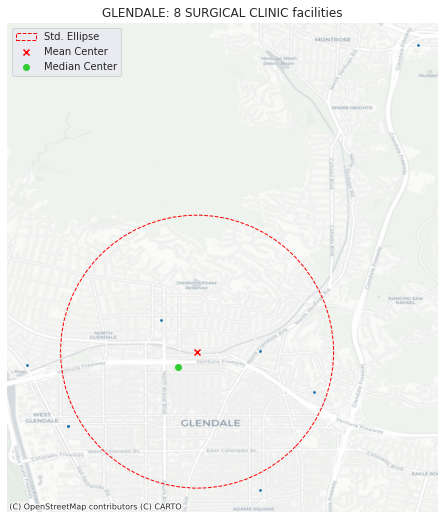

/opt/conda/lib/python3.8/site-packages/pointpats/centrography.py:269: RuntimeWarning: invalid value encountered in double_scalars
  theta = np.arctan(num / den)


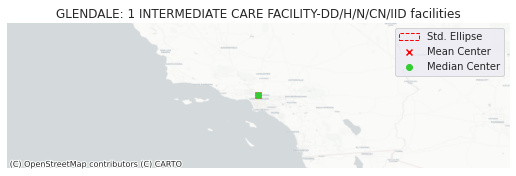

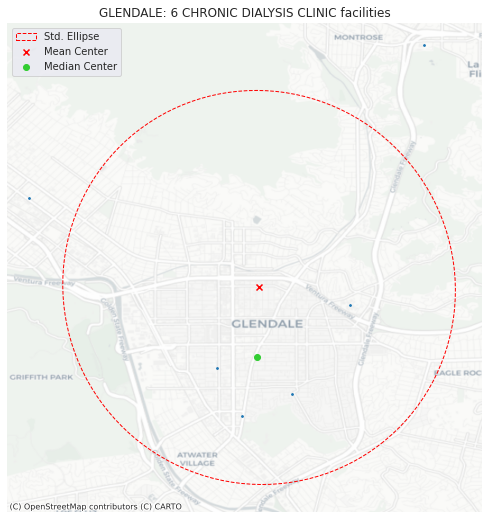

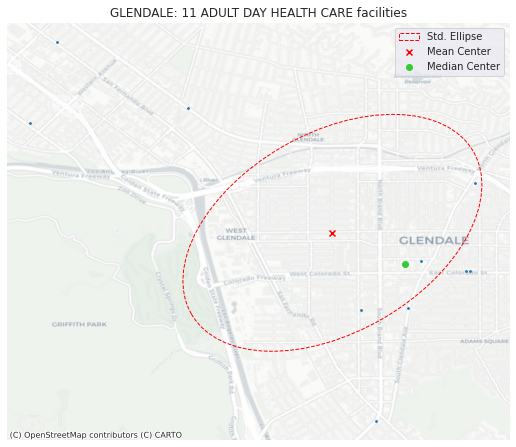

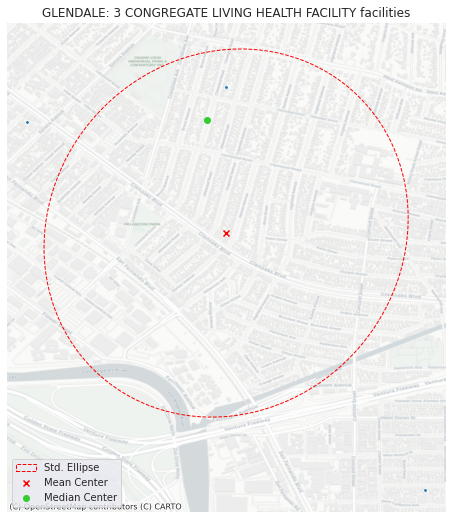

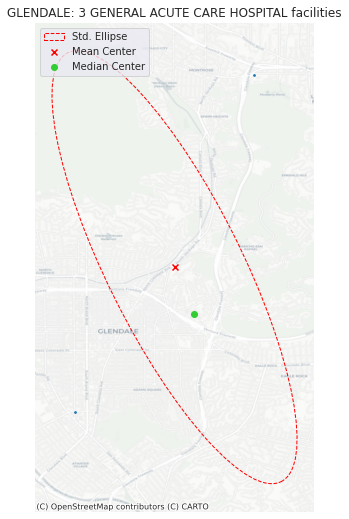

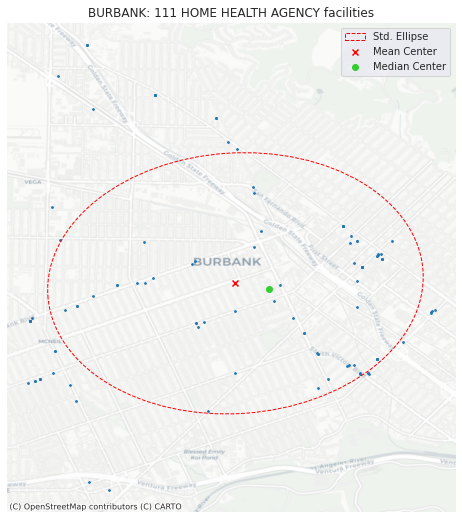

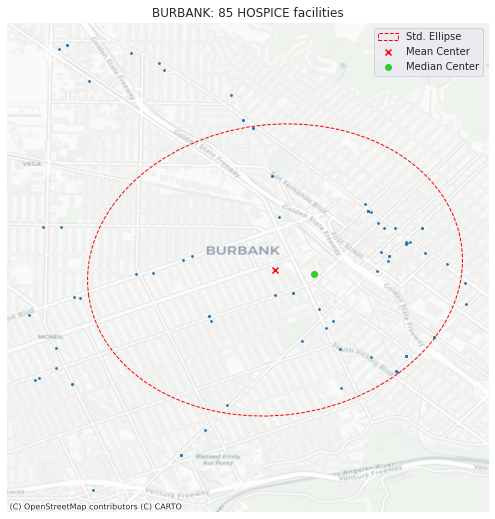

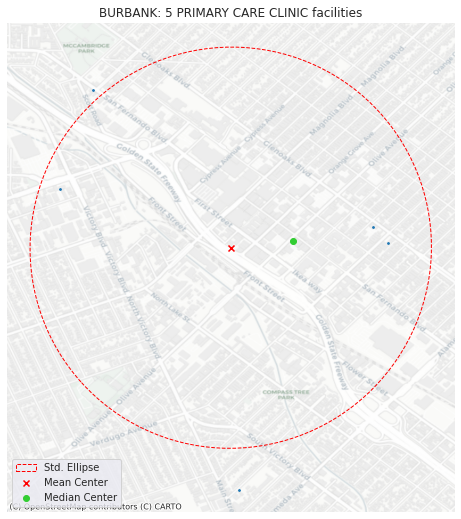

/opt/conda/lib/python3.8/site-packages/pointpats/centrography.py:273: RuntimeWarning: divide by zero encountered in double_scalars
  sd_x = (2 * (xd * cos_theta - yd * sin_theta) ** 2).sum() / n_2
/opt/conda/lib/python3.8/site-packages/pointpats/centrography.py:274: RuntimeWarning: divide by zero encountered in double_scalars
  sd_y = (2 * (xd * sin_theta - yd * cos_theta) ** 2).sum() / n_2


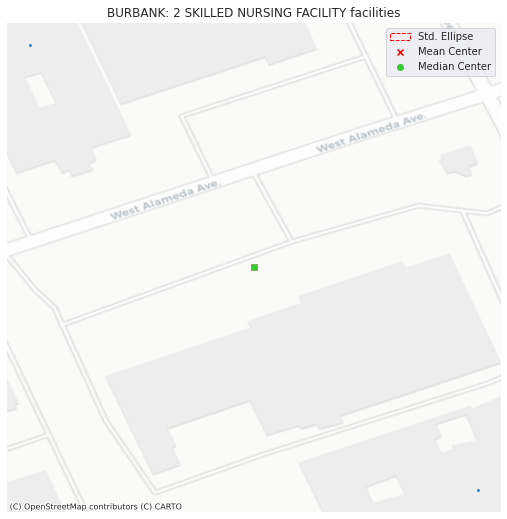

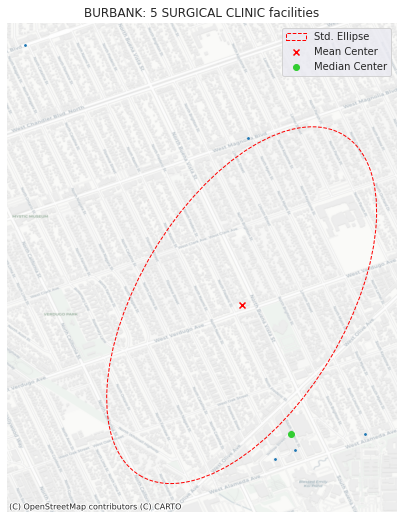

/opt/conda/lib/python3.8/site-packages/pointpats/centrography.py:164: RuntimeWarning: Mean of empty slice.
  return points.mean(axis=0)
/opt/conda/lib/python3.8/site-packages/numpy/core/_methods.py:162: RuntimeWarning: invalid value encountered in true_divide
  ret = um.true_divide(
/opt/conda/lib/python3.8/site-packages/pointpats/centrography.py:262: RuntimeWarning: Mean of empty slice.
  xd = x - x.mean()
/opt/conda/lib/python3.8/site-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/opt/conda/lib/python3.8/site-packages/pointpats/centrography.py:263: RuntimeWarning: Mean of empty slice.
  yd = y - y.mean()
/opt/conda/lib/python3.8/site-packages/pointpats/centrography.py:269: RuntimeWarning: invalid value encountered in double_scalars
  theta = np.arctan(num / den)


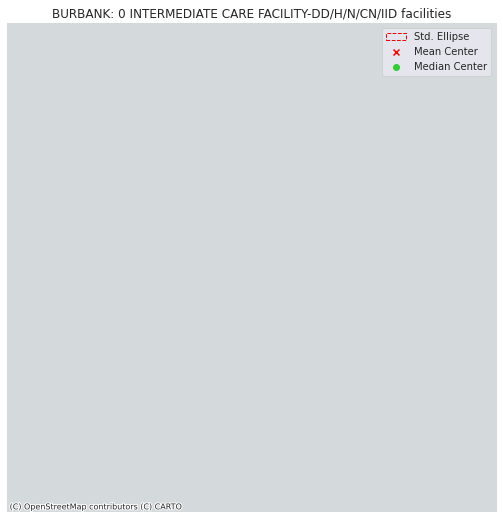

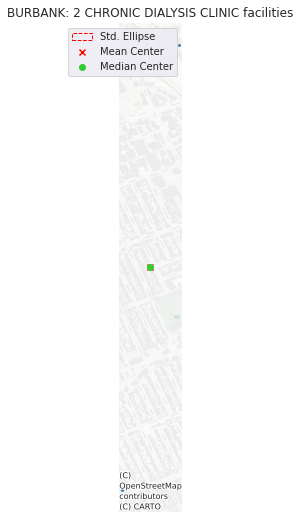

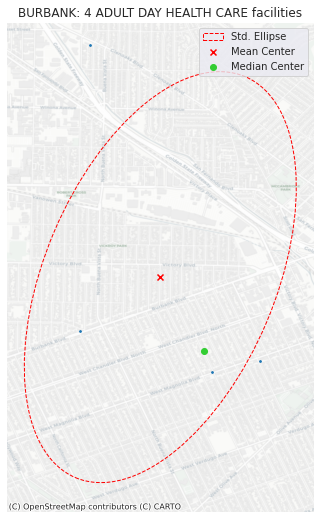

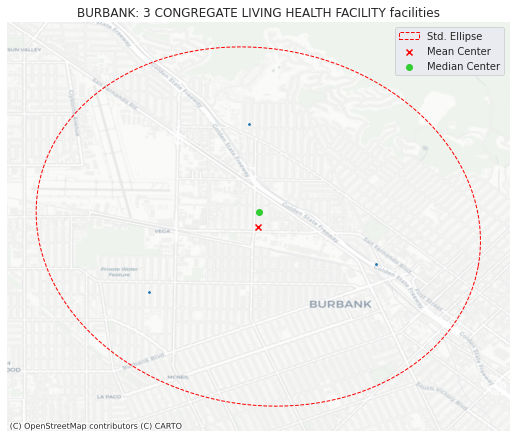

/opt/conda/lib/python3.8/site-packages/pointpats/centrography.py:269: RuntimeWarning: invalid value encountered in double_scalars
  theta = np.arctan(num / den)


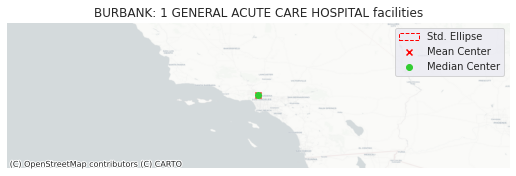

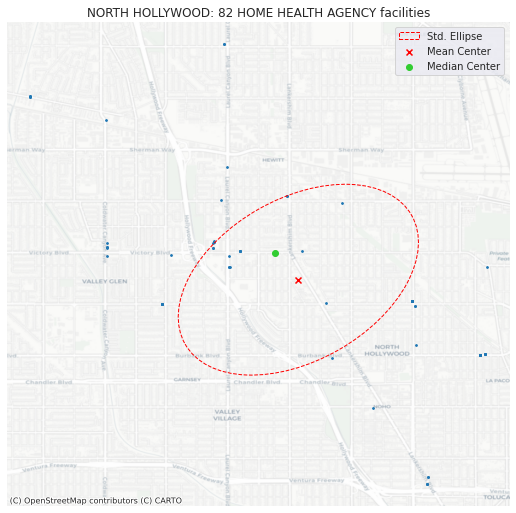

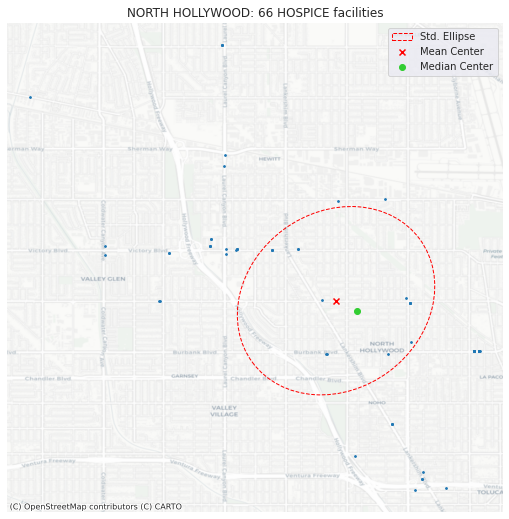

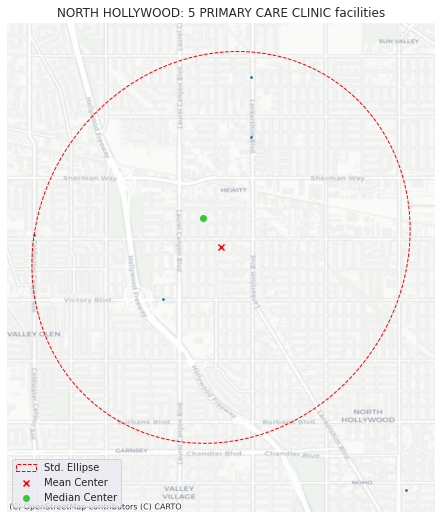

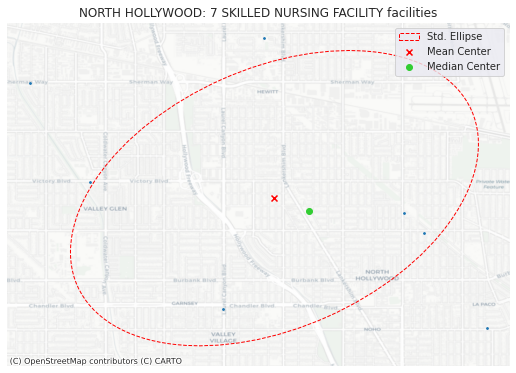

/opt/conda/lib/python3.8/site-packages/pointpats/centrography.py:164: RuntimeWarning: Mean of empty slice.
  return points.mean(axis=0)
/opt/conda/lib/python3.8/site-packages/numpy/core/_methods.py:162: RuntimeWarning: invalid value encountered in true_divide
  ret = um.true_divide(
/opt/conda/lib/python3.8/site-packages/pointpats/centrography.py:262: RuntimeWarning: Mean of empty slice.
  xd = x - x.mean()
/opt/conda/lib/python3.8/site-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/opt/conda/lib/python3.8/site-packages/pointpats/centrography.py:263: RuntimeWarning: Mean of empty slice.
  yd = y - y.mean()
/opt/conda/lib/python3.8/site-packages/pointpats/centrography.py:269: RuntimeWarning: invalid value encountered in double_scalars
  theta = np.arctan(num / den)


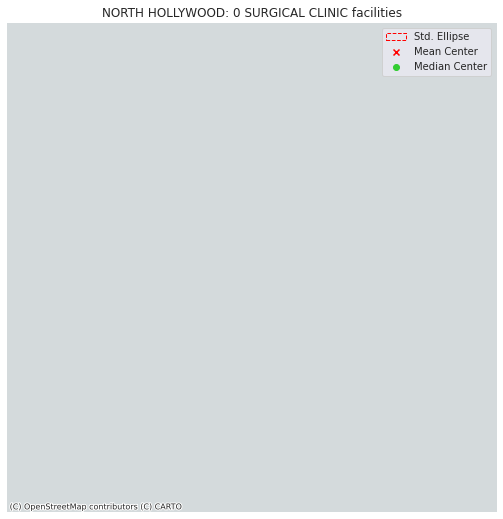

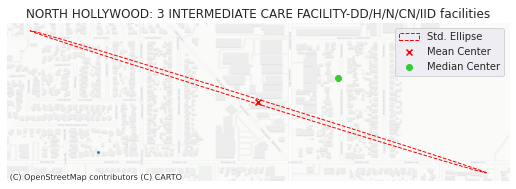

/opt/conda/lib/python3.8/site-packages/pointpats/centrography.py:269: RuntimeWarning: divide by zero encountered in double_scalars
  theta = np.arctan(num / den)
/opt/conda/lib/python3.8/site-packages/pointpats/centrography.py:273: RuntimeWarning: divide by zero encountered in double_scalars
  sd_x = (2 * (xd * cos_theta - yd * sin_theta) ** 2).sum() / n_2
/opt/conda/lib/python3.8/site-packages/pointpats/centrography.py:274: RuntimeWarning: divide by zero encountered in double_scalars
  sd_y = (2 * (xd * sin_theta - yd * cos_theta) ** 2).sum() / n_2


UnidentifiedImageError: cannot identify image file <_io.BytesIO object at 0x7f27cad63a90>

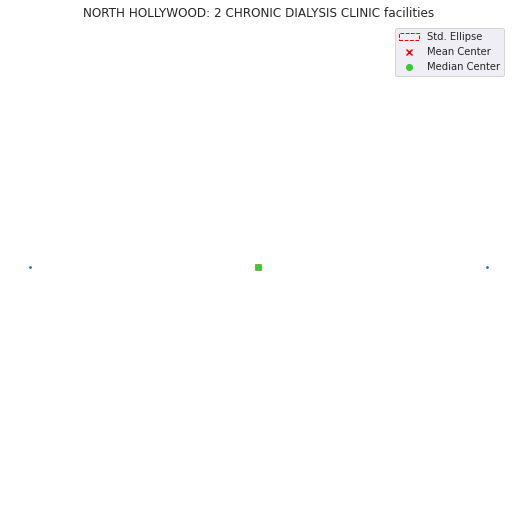

In [30]:
for City in top10areas:
    for Type_of_Care in top10hc:
        acc(City = City, Type_of_Care = Type_of_Care)

In [31]:
bottom10areas = hc['City'].value_counts().tailtop10hc = hc['Type_of_Care'].value_counts().head(10).index.tolist()
top10hc(10).index.tolist()
bottom10areas

['SYLMAR, CA',
 'ACTON',
 'BEL AIR',
 'SIGNAL HILLS',
 'BURBANK, CA',
 'EAST RNCHO DOMINGUEZ',
 'AZUZA',
 'SUN VALLEY, CA',
 'VALLEY GLEN, CA',
 'WEST TOLUCA LAKE']

In [32]:
bottom10hc = hc['Type_of_Care'].value_counts().tail(10).index.tolist()
bottom10hc

['ACUTE PSYCHIATRIC HOSPITAL',
 'REHABILITATION CLINIC',
 'PSYCHOLOGY CLINIC',
 'OTHER',
 'CHEMICAL DEPENDENCY RECOVERY HOSPITAL',
 'REFERRAL AGENCY',
 'CORRECTIONAL TREATMENT CENTER',
 'PEDIATRIC DAY HEALTH & RESPITE CARE FACILITY',
 'ALTERNATIVE BIRTHING CENTER',
 'INTERMEDIATE CARE FACILITY']

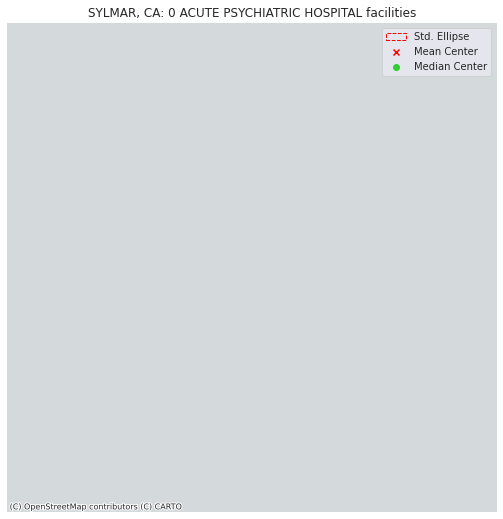

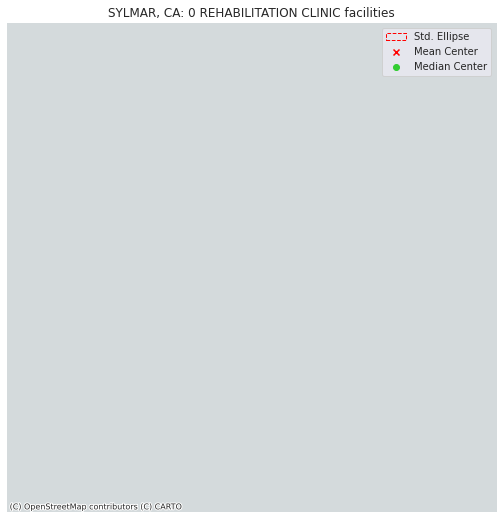

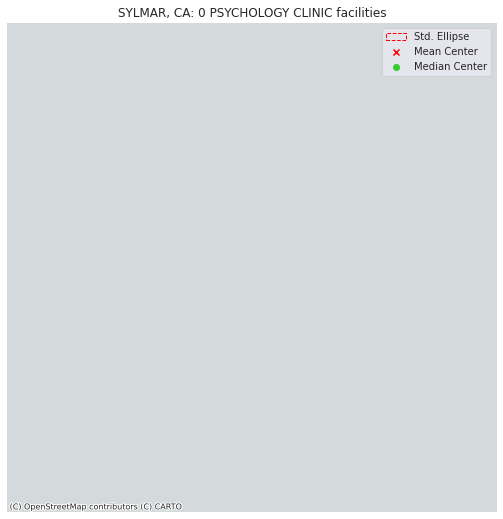

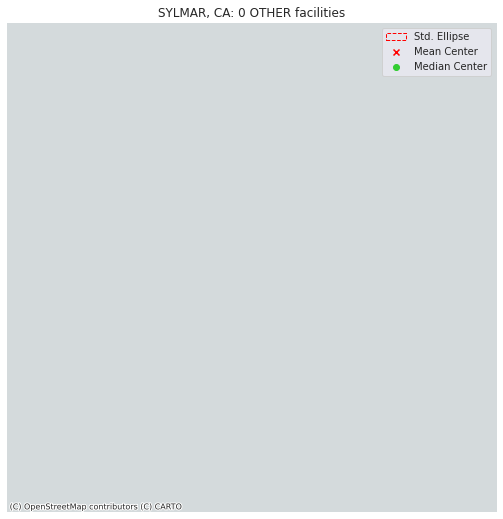

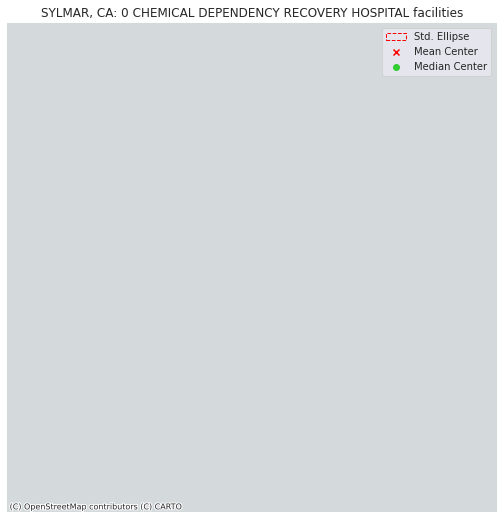

...

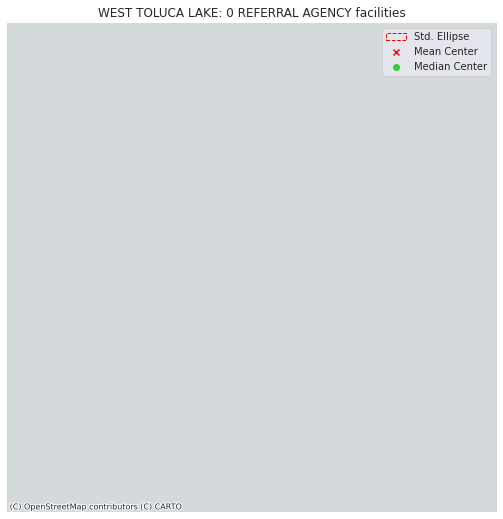

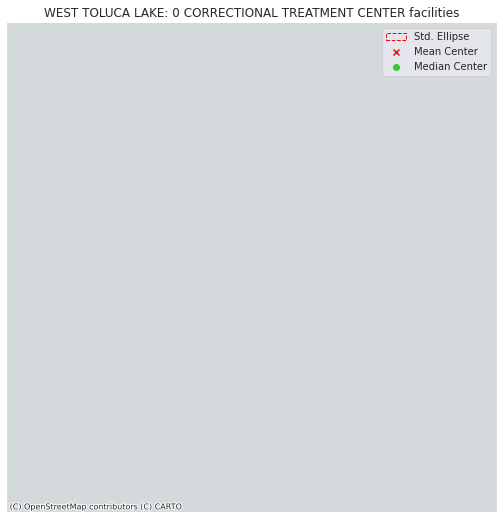

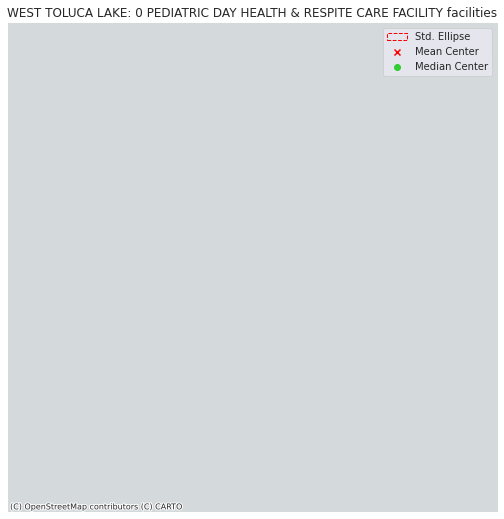

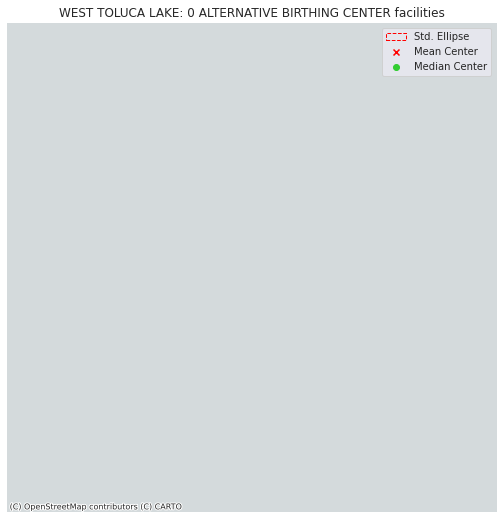

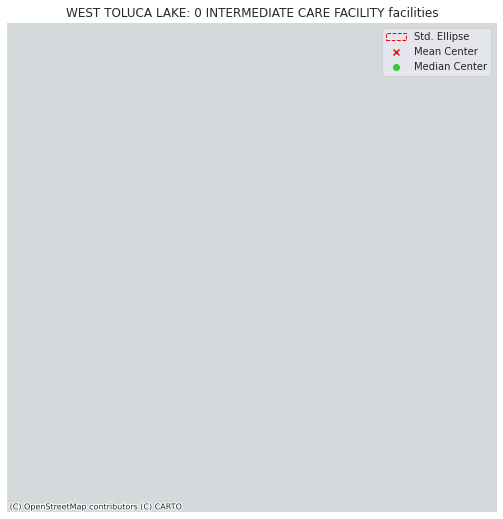

In [33]:
for City in bottom10areas:
    for Type_of_Care in bottom10hc:
        acc(City = City, Type_of_Care = Type_of_Care)

The maps plotted in this notebook are of importance because they show a very specific distribution of healthcare services and thus their accessibility. According to these illustrations, the median location of health care services available is around the Highland Park area in Los Angeles County. The median household income for one of the zip codes in this area is around 80k dollars per year. Also, the top 10 areas with the most healthcare services available include Pasadena which has a median household income of 78k dollars a year. Home health agencies are the most common services within these areas, followed by hospices. On the contrary, the bottom 10 areas with the least healthcare services available include Sun Valley which has a median household income of 53k dollars per year. Rehabilitation clinics are the least accessible to individuals in this area. It is important to acknowledge that some of the areas with no healthcare services nearby, such as Bel Air and Acton, have some of the highest incomes in all of LA County. The lack of medical services in these high income areas is due to the gated and exclusive communities that are within these regions. 

Frida Barragan : contributed by doing a centrography analysis

Keven Michel : contributed by creating joinplots